# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

A subdirectory or file data already exists.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

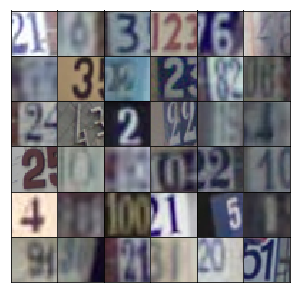

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [1]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

NameError: name 'GAN' is not defined

Epoch 1/25... Discriminator Loss: 1.2408... Generator Loss: 0.6939
Epoch 1/25... Discriminator Loss: 1.0413... Generator Loss: 0.6205
Epoch 1/25... Discriminator Loss: 0.1234... Generator Loss: 4.6810
Epoch 1/25... Discriminator Loss: 0.2150... Generator Loss: 2.6096
Epoch 1/25... Discriminator Loss: 0.3611... Generator Loss: 1.7731
Epoch 1/25... Discriminator Loss: 0.1749... Generator Loss: 2.6919
Epoch 1/25... Discriminator Loss: 0.2750... Generator Loss: 2.2690
Epoch 1/25... Discriminator Loss: 0.1297... Generator Loss: 2.9033
Epoch 1/25... Discriminator Loss: 0.1943... Generator Loss: 3.0655
Epoch 1/25... Discriminator Loss: 0.3465... Generator Loss: 2.7172


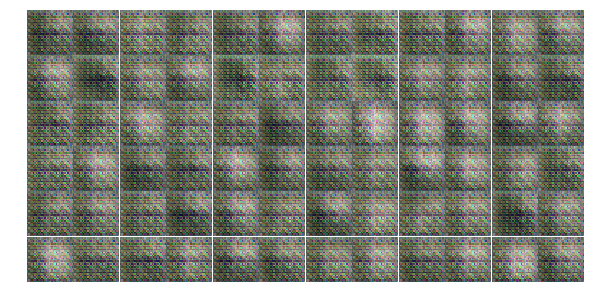

Epoch 1/25... Discriminator Loss: 0.5458... Generator Loss: 1.6789
Epoch 1/25... Discriminator Loss: 0.5471... Generator Loss: 1.5727
Epoch 1/25... Discriminator Loss: 0.4260... Generator Loss: 1.6779
Epoch 1/25... Discriminator Loss: 0.3834... Generator Loss: 1.8027
Epoch 1/25... Discriminator Loss: 0.7320... Generator Loss: 0.9678
Epoch 1/25... Discriminator Loss: 0.5251... Generator Loss: 1.6165
Epoch 1/25... Discriminator Loss: 0.2964... Generator Loss: 2.3501
Epoch 1/25... Discriminator Loss: 0.2129... Generator Loss: 2.6141
Epoch 1/25... Discriminator Loss: 1.3680... Generator Loss: 2.2258
Epoch 1/25... Discriminator Loss: 0.5929... Generator Loss: 2.6593


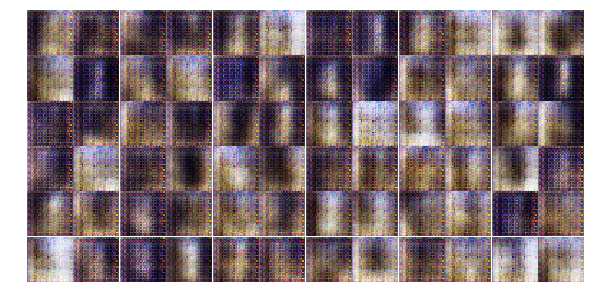

Epoch 1/25... Discriminator Loss: 0.4344... Generator Loss: 2.0321
Epoch 1/25... Discriminator Loss: 0.3313... Generator Loss: 2.2218
Epoch 1/25... Discriminator Loss: 0.6238... Generator Loss: 4.1337
Epoch 1/25... Discriminator Loss: 0.4149... Generator Loss: 3.8245
Epoch 1/25... Discriminator Loss: 0.6397... Generator Loss: 2.1639
Epoch 1/25... Discriminator Loss: 0.3149... Generator Loss: 2.0011
Epoch 1/25... Discriminator Loss: 0.4908... Generator Loss: 2.4662
Epoch 1/25... Discriminator Loss: 0.6879... Generator Loss: 1.3561
Epoch 1/25... Discriminator Loss: 0.5476... Generator Loss: 1.5574
Epoch 1/25... Discriminator Loss: 0.2224... Generator Loss: 3.3322


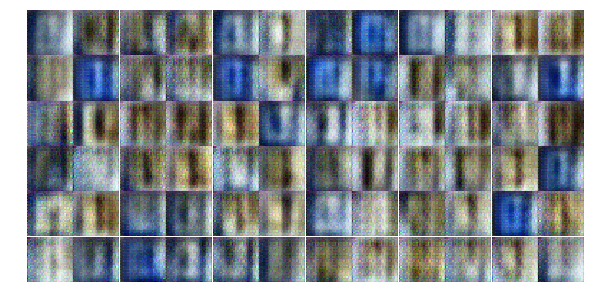

Epoch 1/25... Discriminator Loss: 0.3771... Generator Loss: 1.6792
Epoch 1/25... Discriminator Loss: 0.4593... Generator Loss: 1.5571
Epoch 1/25... Discriminator Loss: 0.4100... Generator Loss: 3.7166
Epoch 1/25... Discriminator Loss: 0.7056... Generator Loss: 1.1379
Epoch 1/25... Discriminator Loss: 0.8685... Generator Loss: 0.9739
Epoch 1/25... Discriminator Loss: 0.7269... Generator Loss: 1.0178
Epoch 1/25... Discriminator Loss: 0.7408... Generator Loss: 0.9943
Epoch 1/25... Discriminator Loss: 0.5539... Generator Loss: 1.9982
Epoch 1/25... Discriminator Loss: 0.8038... Generator Loss: 1.9224
Epoch 1/25... Discriminator Loss: 0.7190... Generator Loss: 1.3543


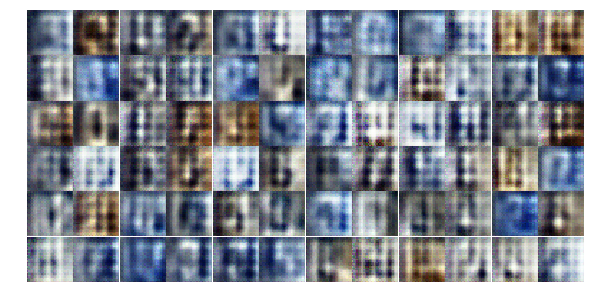

Epoch 1/25... Discriminator Loss: 0.9521... Generator Loss: 1.5459
Epoch 1/25... Discriminator Loss: 0.8269... Generator Loss: 0.9503
Epoch 1/25... Discriminator Loss: 0.5982... Generator Loss: 2.2444
Epoch 1/25... Discriminator Loss: 0.7795... Generator Loss: 1.4114
Epoch 1/25... Discriminator Loss: 0.7797... Generator Loss: 1.1786
Epoch 1/25... Discriminator Loss: 0.7410... Generator Loss: 0.9363
Epoch 1/25... Discriminator Loss: 0.7618... Generator Loss: 1.1108
Epoch 1/25... Discriminator Loss: 0.7291... Generator Loss: 1.3309
Epoch 1/25... Discriminator Loss: 0.9924... Generator Loss: 1.5585
Epoch 1/25... Discriminator Loss: 0.8015... Generator Loss: 1.4948


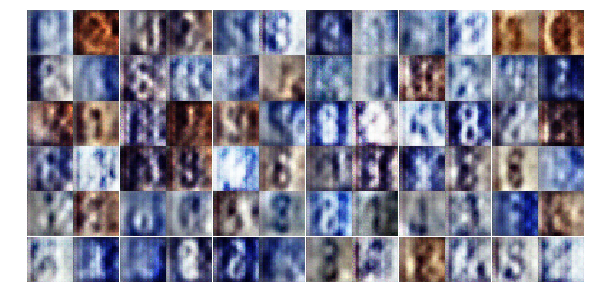

Epoch 1/25... Discriminator Loss: 0.6141... Generator Loss: 1.4744
Epoch 1/25... Discriminator Loss: 1.2077... Generator Loss: 0.6348
Epoch 1/25... Discriminator Loss: 0.6424... Generator Loss: 1.7126
Epoch 1/25... Discriminator Loss: 0.9061... Generator Loss: 0.8370
Epoch 1/25... Discriminator Loss: 0.6230... Generator Loss: 1.8948
Epoch 1/25... Discriminator Loss: 0.5942... Generator Loss: 1.4814
Epoch 1/25... Discriminator Loss: 0.7782... Generator Loss: 1.1004
Epoch 2/25... Discriminator Loss: 0.9747... Generator Loss: 1.4394
Epoch 2/25... Discriminator Loss: 0.8385... Generator Loss: 1.7964
Epoch 2/25... Discriminator Loss: 1.1886... Generator Loss: 0.7996


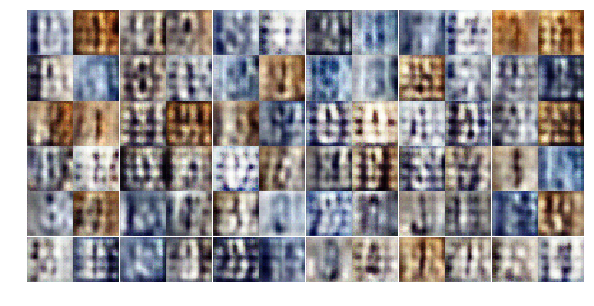

Epoch 2/25... Discriminator Loss: 0.7590... Generator Loss: 1.5696
Epoch 2/25... Discriminator Loss: 1.2369... Generator Loss: 0.9575
Epoch 2/25... Discriminator Loss: 0.9204... Generator Loss: 0.9168
Epoch 2/25... Discriminator Loss: 1.1061... Generator Loss: 1.3103
Epoch 2/25... Discriminator Loss: 1.3341... Generator Loss: 0.6609
Epoch 2/25... Discriminator Loss: 0.9813... Generator Loss: 1.1832
Epoch 2/25... Discriminator Loss: 1.3661... Generator Loss: 0.6189
Epoch 2/25... Discriminator Loss: 0.7863... Generator Loss: 1.3080
Epoch 2/25... Discriminator Loss: 1.1068... Generator Loss: 0.7802
Epoch 2/25... Discriminator Loss: 1.3737... Generator Loss: 0.5247


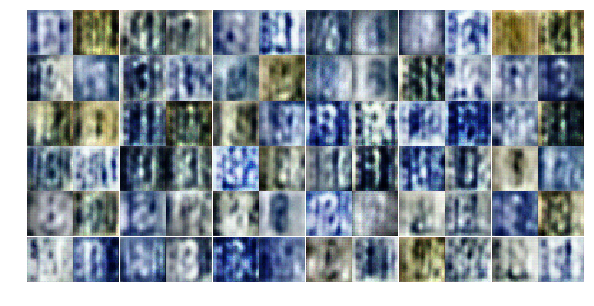

Epoch 2/25... Discriminator Loss: 1.0509... Generator Loss: 0.9262
Epoch 2/25... Discriminator Loss: 1.2918... Generator Loss: 1.0418
Epoch 2/25... Discriminator Loss: 0.9219... Generator Loss: 0.9539
Epoch 2/25... Discriminator Loss: 0.9955... Generator Loss: 0.8271
Epoch 2/25... Discriminator Loss: 1.0011... Generator Loss: 1.2890
Epoch 2/25... Discriminator Loss: 1.0425... Generator Loss: 1.0608
Epoch 2/25... Discriminator Loss: 1.2397... Generator Loss: 0.8527
Epoch 2/25... Discriminator Loss: 1.0868... Generator Loss: 1.0318
Epoch 2/25... Discriminator Loss: 1.0913... Generator Loss: 0.9673
Epoch 2/25... Discriminator Loss: 0.8186... Generator Loss: 0.9959


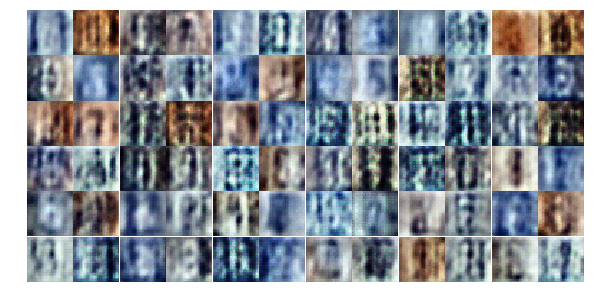

Epoch 2/25... Discriminator Loss: 0.8919... Generator Loss: 0.9910
Epoch 2/25... Discriminator Loss: 0.8122... Generator Loss: 1.3397
Epoch 2/25... Discriminator Loss: 0.8999... Generator Loss: 1.1609
Epoch 2/25... Discriminator Loss: 0.8051... Generator Loss: 1.3037
Epoch 2/25... Discriminator Loss: 0.7248... Generator Loss: 1.4681
Epoch 2/25... Discriminator Loss: 0.7074... Generator Loss: 1.3164
Epoch 2/25... Discriminator Loss: 0.9551... Generator Loss: 1.6416
Epoch 2/25... Discriminator Loss: 0.8329... Generator Loss: 1.0812
Epoch 2/25... Discriminator Loss: 1.4132... Generator Loss: 1.0330
Epoch 2/25... Discriminator Loss: 1.1215... Generator Loss: 0.7473


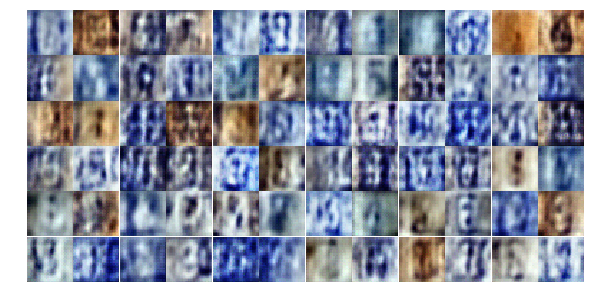

Epoch 2/25... Discriminator Loss: 0.9396... Generator Loss: 1.4633
Epoch 2/25... Discriminator Loss: 1.0980... Generator Loss: 0.9055
Epoch 2/25... Discriminator Loss: 1.0168... Generator Loss: 0.8314
Epoch 2/25... Discriminator Loss: 1.1294... Generator Loss: 0.7526
Epoch 2/25... Discriminator Loss: 0.9039... Generator Loss: 1.8281
Epoch 2/25... Discriminator Loss: 1.0870... Generator Loss: 1.8554
Epoch 2/25... Discriminator Loss: 1.1215... Generator Loss: 0.7385
Epoch 2/25... Discriminator Loss: 0.9556... Generator Loss: 1.5078
Epoch 2/25... Discriminator Loss: 0.9371... Generator Loss: 0.9939
Epoch 2/25... Discriminator Loss: 0.8292... Generator Loss: 2.0028


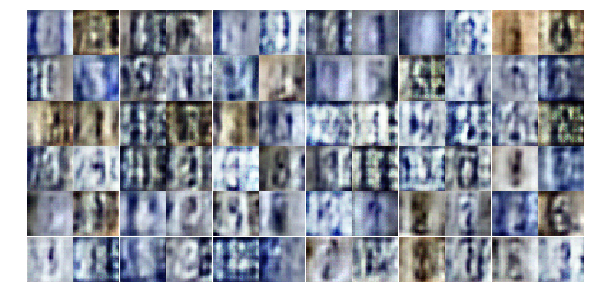

Epoch 2/25... Discriminator Loss: 1.0625... Generator Loss: 2.2047
Epoch 2/25... Discriminator Loss: 1.0465... Generator Loss: 1.7329
Epoch 2/25... Discriminator Loss: 1.2329... Generator Loss: 0.5770
Epoch 2/25... Discriminator Loss: 0.8251... Generator Loss: 0.9714
Epoch 2/25... Discriminator Loss: 0.7778... Generator Loss: 1.3185
Epoch 2/25... Discriminator Loss: 1.0453... Generator Loss: 0.7557
Epoch 2/25... Discriminator Loss: 0.5372... Generator Loss: 1.5601
Epoch 2/25... Discriminator Loss: 0.8362... Generator Loss: 1.6405
Epoch 2/25... Discriminator Loss: 0.7520... Generator Loss: 1.3098
Epoch 2/25... Discriminator Loss: 0.7963... Generator Loss: 1.2433


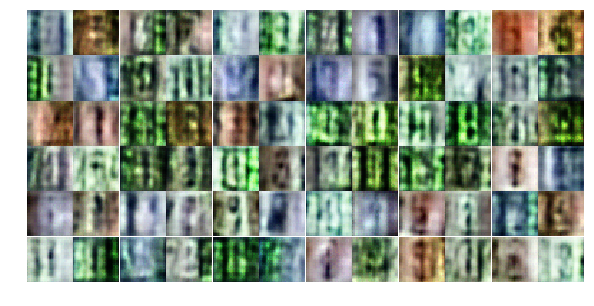

Epoch 2/25... Discriminator Loss: 0.6403... Generator Loss: 2.0740
Epoch 2/25... Discriminator Loss: 0.7654... Generator Loss: 1.4650
Epoch 2/25... Discriminator Loss: 1.0342... Generator Loss: 0.8144
Epoch 2/25... Discriminator Loss: 0.8300... Generator Loss: 1.6425
Epoch 3/25... Discriminator Loss: 0.7524... Generator Loss: 1.6428
Epoch 3/25... Discriminator Loss: 0.7153... Generator Loss: 1.1268
Epoch 3/25... Discriminator Loss: 0.6305... Generator Loss: 1.3188
Epoch 3/25... Discriminator Loss: 0.7052... Generator Loss: 1.2716
Epoch 3/25... Discriminator Loss: 0.6185... Generator Loss: 2.2060
Epoch 3/25... Discriminator Loss: 0.7828... Generator Loss: 1.2444


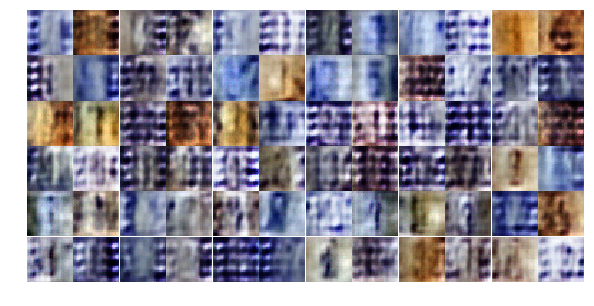

Epoch 3/25... Discriminator Loss: 0.4728... Generator Loss: 2.4912
Epoch 3/25... Discriminator Loss: 0.5184... Generator Loss: 2.0049
Epoch 3/25... Discriminator Loss: 0.9322... Generator Loss: 0.9990
Epoch 3/25... Discriminator Loss: 0.9559... Generator Loss: 0.9461
Epoch 3/25... Discriminator Loss: 0.5810... Generator Loss: 1.5460
Epoch 3/25... Discriminator Loss: 0.4543... Generator Loss: 2.5012
Epoch 3/25... Discriminator Loss: 0.7538... Generator Loss: 1.0799
Epoch 3/25... Discriminator Loss: 0.5871... Generator Loss: 1.3946
Epoch 3/25... Discriminator Loss: 0.9498... Generator Loss: 0.8026
Epoch 3/25... Discriminator Loss: 0.6573... Generator Loss: 1.3219


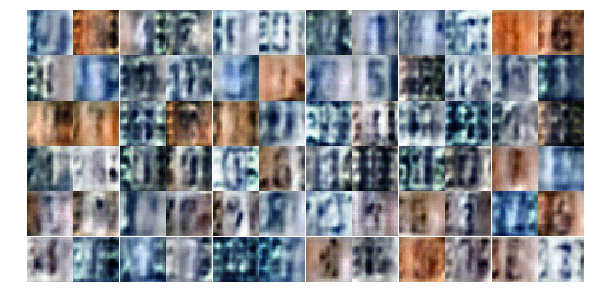

Epoch 3/25... Discriminator Loss: 0.6305... Generator Loss: 1.4695
Epoch 3/25... Discriminator Loss: 0.7494... Generator Loss: 1.7630
Epoch 3/25... Discriminator Loss: 0.8208... Generator Loss: 1.1983
Epoch 3/25... Discriminator Loss: 0.3053... Generator Loss: 2.5159
Epoch 3/25... Discriminator Loss: 0.5501... Generator Loss: 1.6533
Epoch 3/25... Discriminator Loss: 0.3979... Generator Loss: 2.4289
Epoch 3/25... Discriminator Loss: 1.1561... Generator Loss: 0.5244
Epoch 3/25... Discriminator Loss: 0.8283... Generator Loss: 1.5314
Epoch 3/25... Discriminator Loss: 1.1623... Generator Loss: 2.4888
Epoch 3/25... Discriminator Loss: 0.5860... Generator Loss: 1.4578


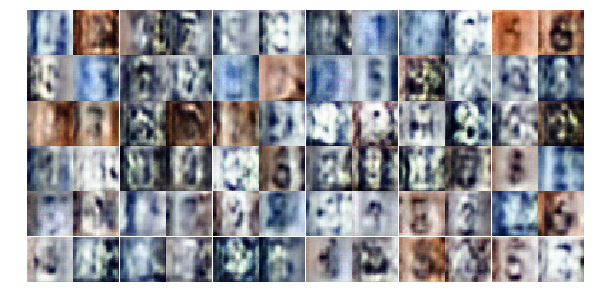

Epoch 3/25... Discriminator Loss: 0.6773... Generator Loss: 1.1373
Epoch 3/25... Discriminator Loss: 0.7684... Generator Loss: 1.0291
Epoch 3/25... Discriminator Loss: 0.4072... Generator Loss: 1.9461
Epoch 3/25... Discriminator Loss: 0.6078... Generator Loss: 1.1017
Epoch 3/25... Discriminator Loss: 0.4364... Generator Loss: 1.8067
Epoch 3/25... Discriminator Loss: 0.8326... Generator Loss: 1.0859
Epoch 3/25... Discriminator Loss: 0.8480... Generator Loss: 0.7936
Epoch 3/25... Discriminator Loss: 0.9184... Generator Loss: 0.7572
Epoch 3/25... Discriminator Loss: 0.5383... Generator Loss: 1.9971
Epoch 3/25... Discriminator Loss: 0.4058... Generator Loss: 1.8338


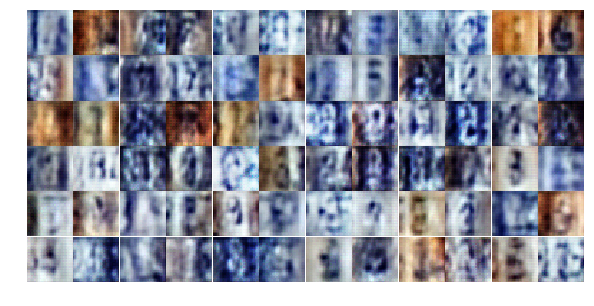

Epoch 3/25... Discriminator Loss: 0.6011... Generator Loss: 1.9672
Epoch 3/25... Discriminator Loss: 0.4727... Generator Loss: 1.4110
Epoch 3/25... Discriminator Loss: 0.9220... Generator Loss: 0.8170
Epoch 3/25... Discriminator Loss: 0.5359... Generator Loss: 1.3070
Epoch 3/25... Discriminator Loss: 0.7042... Generator Loss: 1.2824
Epoch 3/25... Discriminator Loss: 0.5830... Generator Loss: 1.5344
Epoch 3/25... Discriminator Loss: 0.8678... Generator Loss: 1.5538
Epoch 3/25... Discriminator Loss: 0.5624... Generator Loss: 1.3789
Epoch 3/25... Discriminator Loss: 0.9976... Generator Loss: 2.2654
Epoch 3/25... Discriminator Loss: 0.5265... Generator Loss: 1.8829


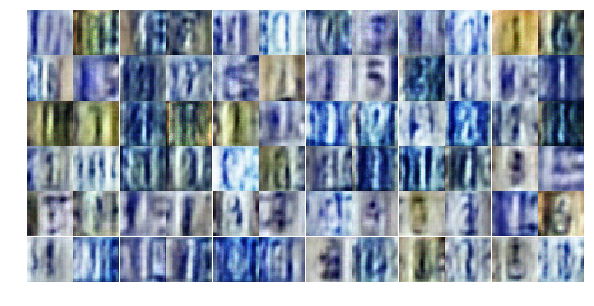

Epoch 3/25... Discriminator Loss: 0.6232... Generator Loss: 1.2158
Epoch 3/25... Discriminator Loss: 1.6469... Generator Loss: 2.8361
Epoch 3/25... Discriminator Loss: 0.7426... Generator Loss: 1.1412
Epoch 3/25... Discriminator Loss: 0.5725... Generator Loss: 1.5690
Epoch 3/25... Discriminator Loss: 1.3454... Generator Loss: 2.5550
Epoch 3/25... Discriminator Loss: 0.7818... Generator Loss: 2.1177
Epoch 3/25... Discriminator Loss: 0.7264... Generator Loss: 1.2795
Epoch 3/25... Discriminator Loss: 0.4463... Generator Loss: 1.9720
Epoch 3/25... Discriminator Loss: 0.5229... Generator Loss: 1.3067
Epoch 3/25... Discriminator Loss: 0.5677... Generator Loss: 2.1156


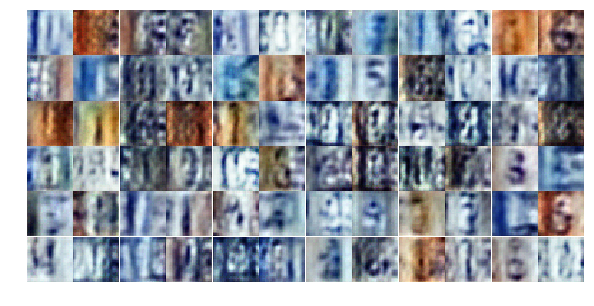

Epoch 3/25... Discriminator Loss: 0.7128... Generator Loss: 1.0025
Epoch 4/25... Discriminator Loss: 0.7635... Generator Loss: 0.9744
Epoch 4/25... Discriminator Loss: 1.0054... Generator Loss: 0.6397
Epoch 4/25... Discriminator Loss: 1.6101... Generator Loss: 0.4354
Epoch 4/25... Discriminator Loss: 0.4457... Generator Loss: 2.1587
Epoch 4/25... Discriminator Loss: 1.0999... Generator Loss: 0.6371
Epoch 4/25... Discriminator Loss: 0.6477... Generator Loss: 2.6390
Epoch 4/25... Discriminator Loss: 0.5601... Generator Loss: 1.8728
Epoch 4/25... Discriminator Loss: 0.3403... Generator Loss: 1.8439
Epoch 4/25... Discriminator Loss: 0.6104... Generator Loss: 2.9009


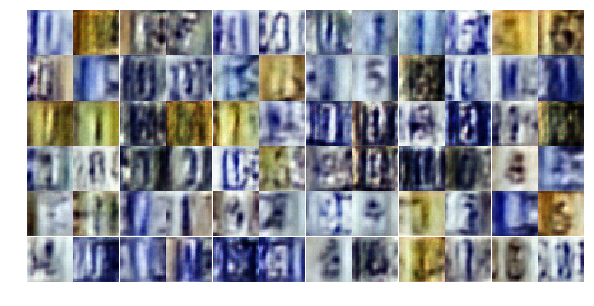

Epoch 4/25... Discriminator Loss: 0.3570... Generator Loss: 2.2891
Epoch 4/25... Discriminator Loss: 0.6164... Generator Loss: 1.0490
Epoch 4/25... Discriminator Loss: 1.0293... Generator Loss: 0.9018
Epoch 4/25... Discriminator Loss: 0.6200... Generator Loss: 2.0886
Epoch 4/25... Discriminator Loss: 0.5496... Generator Loss: 1.3012
Epoch 4/25... Discriminator Loss: 1.0325... Generator Loss: 0.6551
Epoch 4/25... Discriminator Loss: 1.8951... Generator Loss: 0.2530
Epoch 4/25... Discriminator Loss: 1.3682... Generator Loss: 0.4491
Epoch 4/25... Discriminator Loss: 0.9719... Generator Loss: 1.6129
Epoch 4/25... Discriminator Loss: 0.6981... Generator Loss: 1.8685


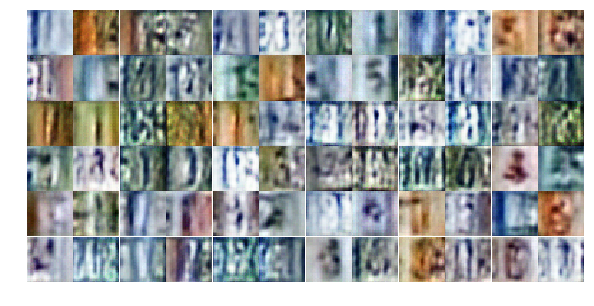

Epoch 4/25... Discriminator Loss: 0.3512... Generator Loss: 2.3897
Epoch 4/25... Discriminator Loss: 0.5960... Generator Loss: 1.3931
Epoch 4/25... Discriminator Loss: 0.5670... Generator Loss: 1.3146
Epoch 4/25... Discriminator Loss: 0.8443... Generator Loss: 1.2656
Epoch 4/25... Discriminator Loss: 0.4194... Generator Loss: 1.8579
Epoch 4/25... Discriminator Loss: 0.2583... Generator Loss: 2.8161
Epoch 4/25... Discriminator Loss: 0.4276... Generator Loss: 1.6420
Epoch 4/25... Discriminator Loss: 0.8999... Generator Loss: 0.9199
Epoch 4/25... Discriminator Loss: 0.3283... Generator Loss: 2.0086
Epoch 4/25... Discriminator Loss: 0.3674... Generator Loss: 2.0837


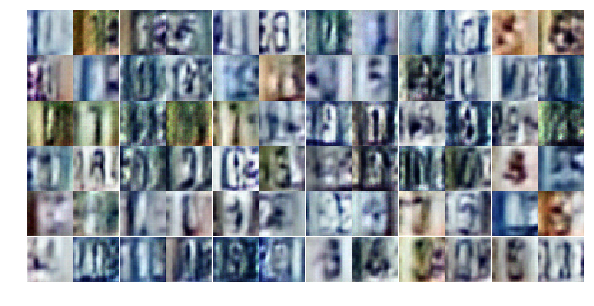

Epoch 4/25... Discriminator Loss: 0.4781... Generator Loss: 1.4844
Epoch 4/25... Discriminator Loss: 0.4028... Generator Loss: 1.6819
Epoch 4/25... Discriminator Loss: 0.4298... Generator Loss: 1.5817
Epoch 4/25... Discriminator Loss: 0.3675... Generator Loss: 1.8799
Epoch 4/25... Discriminator Loss: 0.4353... Generator Loss: 1.4773
Epoch 4/25... Discriminator Loss: 0.6036... Generator Loss: 2.1688
Epoch 4/25... Discriminator Loss: 0.5818... Generator Loss: 1.9498
Epoch 4/25... Discriminator Loss: 0.6284... Generator Loss: 2.4116
Epoch 4/25... Discriminator Loss: 0.5468... Generator Loss: 2.4346
Epoch 4/25... Discriminator Loss: 0.7187... Generator Loss: 1.0177


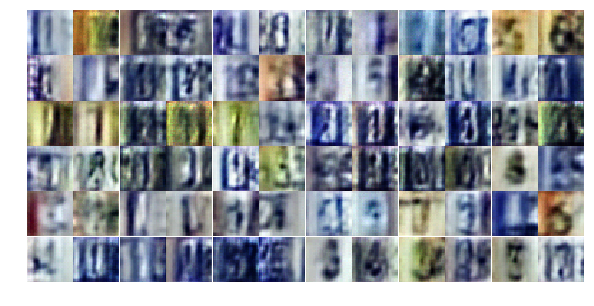

Epoch 4/25... Discriminator Loss: 0.5856... Generator Loss: 1.3043
Epoch 4/25... Discriminator Loss: 0.4950... Generator Loss: 1.3243
Epoch 4/25... Discriminator Loss: 0.4857... Generator Loss: 1.3394
Epoch 4/25... Discriminator Loss: 0.3938... Generator Loss: 1.7246
Epoch 4/25... Discriminator Loss: 0.3971... Generator Loss: 1.6801
Epoch 4/25... Discriminator Loss: 0.6180... Generator Loss: 1.3761
Epoch 4/25... Discriminator Loss: 0.3516... Generator Loss: 1.6981
Epoch 4/25... Discriminator Loss: 0.8181... Generator Loss: 3.0840
Epoch 4/25... Discriminator Loss: 1.0188... Generator Loss: 1.0076
Epoch 4/25... Discriminator Loss: 0.7237... Generator Loss: 1.3626


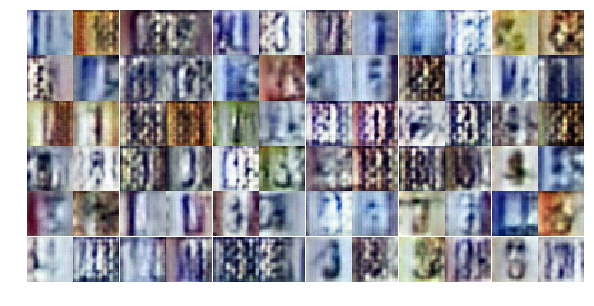

Epoch 4/25... Discriminator Loss: 0.5544... Generator Loss: 1.4200
Epoch 4/25... Discriminator Loss: 0.5303... Generator Loss: 1.3965
Epoch 4/25... Discriminator Loss: 0.3950... Generator Loss: 1.5432
Epoch 4/25... Discriminator Loss: 0.4018... Generator Loss: 2.1239
Epoch 4/25... Discriminator Loss: 0.8160... Generator Loss: 0.8205
Epoch 4/25... Discriminator Loss: 0.6138... Generator Loss: 1.2717
Epoch 4/25... Discriminator Loss: 0.4465... Generator Loss: 1.4874
Epoch 4/25... Discriminator Loss: 0.6815... Generator Loss: 1.1462
Epoch 4/25... Discriminator Loss: 0.5036... Generator Loss: 2.0063
Epoch 5/25... Discriminator Loss: 0.4105... Generator Loss: 2.2688


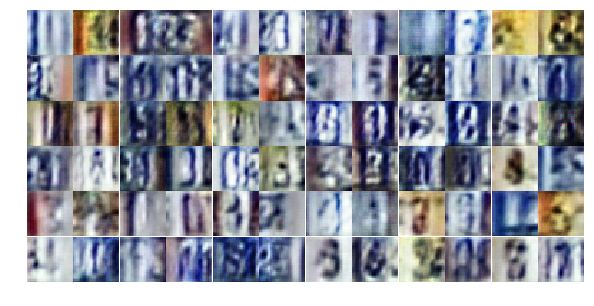

Epoch 5/25... Discriminator Loss: 0.7133... Generator Loss: 0.9354
Epoch 5/25... Discriminator Loss: 0.7249... Generator Loss: 1.3700
Epoch 5/25... Discriminator Loss: 0.6591... Generator Loss: 1.1088
Epoch 5/25... Discriminator Loss: 0.6045... Generator Loss: 1.1552
Epoch 5/25... Discriminator Loss: 0.2882... Generator Loss: 2.3757
Epoch 5/25... Discriminator Loss: 0.7820... Generator Loss: 0.7889
Epoch 5/25... Discriminator Loss: 0.4773... Generator Loss: 1.3376
Epoch 5/25... Discriminator Loss: 0.3884... Generator Loss: 1.4573
Epoch 5/25... Discriminator Loss: 0.8309... Generator Loss: 0.8520
Epoch 5/25... Discriminator Loss: 0.8365... Generator Loss: 1.4754


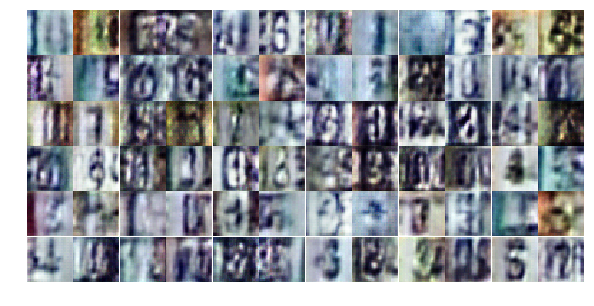

Epoch 5/25... Discriminator Loss: 0.5980... Generator Loss: 2.5375
Epoch 5/25... Discriminator Loss: 0.6102... Generator Loss: 1.1230
Epoch 5/25... Discriminator Loss: 0.4798... Generator Loss: 1.6859
Epoch 5/25... Discriminator Loss: 0.9792... Generator Loss: 0.6999
Epoch 5/25... Discriminator Loss: 0.5026... Generator Loss: 1.5553
Epoch 5/25... Discriminator Loss: 0.5806... Generator Loss: 2.5176
Epoch 5/25... Discriminator Loss: 0.7047... Generator Loss: 0.9556
Epoch 5/25... Discriminator Loss: 0.4749... Generator Loss: 1.4569
Epoch 5/25... Discriminator Loss: 0.3889... Generator Loss: 1.9384
Epoch 5/25... Discriminator Loss: 0.4145... Generator Loss: 1.8614


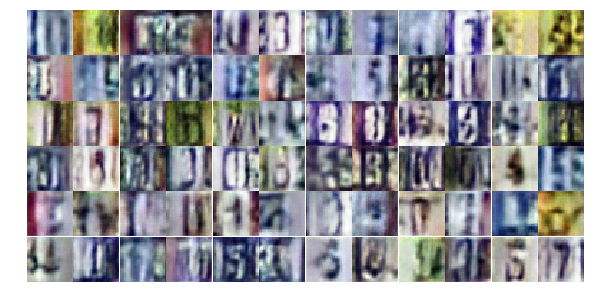

Epoch 5/25... Discriminator Loss: 1.7985... Generator Loss: 2.9042
Epoch 5/25... Discriminator Loss: 1.2142... Generator Loss: 0.5741
Epoch 5/25... Discriminator Loss: 1.1889... Generator Loss: 0.5305
Epoch 5/25... Discriminator Loss: 0.7612... Generator Loss: 0.8764
Epoch 5/25... Discriminator Loss: 0.5363... Generator Loss: 1.2560
Epoch 5/25... Discriminator Loss: 0.8173... Generator Loss: 0.8553
Epoch 5/25... Discriminator Loss: 0.8422... Generator Loss: 0.8199
Epoch 5/25... Discriminator Loss: 0.5136... Generator Loss: 1.5880
Epoch 5/25... Discriminator Loss: 0.6516... Generator Loss: 1.3482
Epoch 5/25... Discriminator Loss: 0.5748... Generator Loss: 2.8765


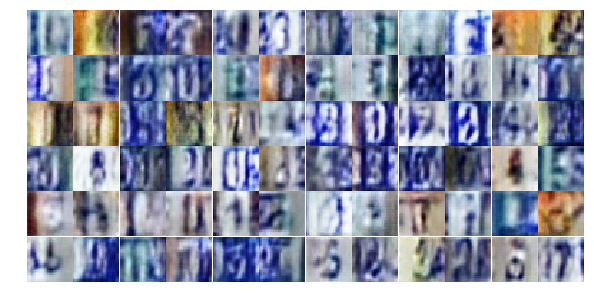

Epoch 5/25... Discriminator Loss: 0.6225... Generator Loss: 1.7313
Epoch 5/25... Discriminator Loss: 0.4863... Generator Loss: 1.8323
Epoch 5/25... Discriminator Loss: 0.3881... Generator Loss: 2.1685
Epoch 5/25... Discriminator Loss: 1.1710... Generator Loss: 3.2694
Epoch 5/25... Discriminator Loss: 0.6666... Generator Loss: 1.9174
Epoch 5/25... Discriminator Loss: 0.6159... Generator Loss: 1.9091
Epoch 5/25... Discriminator Loss: 1.3488... Generator Loss: 0.4309
Epoch 5/25... Discriminator Loss: 1.2025... Generator Loss: 0.5608
Epoch 5/25... Discriminator Loss: 1.1996... Generator Loss: 0.4763
Epoch 5/25... Discriminator Loss: 0.4998... Generator Loss: 1.5240


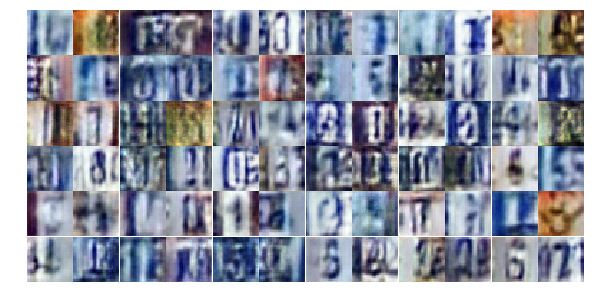

Epoch 5/25... Discriminator Loss: 0.3893... Generator Loss: 1.7418
Epoch 5/25... Discriminator Loss: 0.7562... Generator Loss: 0.8895
Epoch 5/25... Discriminator Loss: 1.1934... Generator Loss: 0.4726
Epoch 5/25... Discriminator Loss: 0.3900... Generator Loss: 1.6056
Epoch 5/25... Discriminator Loss: 1.4746... Generator Loss: 3.0665
Epoch 5/25... Discriminator Loss: 0.9601... Generator Loss: 0.6287
Epoch 5/25... Discriminator Loss: 0.6505... Generator Loss: 1.1991
Epoch 5/25... Discriminator Loss: 0.5081... Generator Loss: 1.2790
Epoch 5/25... Discriminator Loss: 2.1025... Generator Loss: 0.1998
Epoch 5/25... Discriminator Loss: 1.2618... Generator Loss: 2.7454


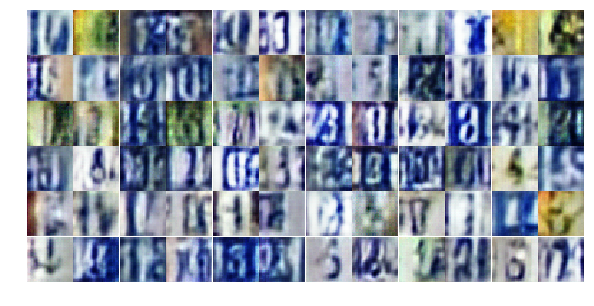

Epoch 5/25... Discriminator Loss: 0.8840... Generator Loss: 0.7912
Epoch 5/25... Discriminator Loss: 0.6583... Generator Loss: 1.0749
Epoch 5/25... Discriminator Loss: 0.9984... Generator Loss: 0.6018
Epoch 5/25... Discriminator Loss: 0.8123... Generator Loss: 0.7913
Epoch 5/25... Discriminator Loss: 0.4780... Generator Loss: 1.7661
Epoch 5/25... Discriminator Loss: 1.0273... Generator Loss: 0.6113
Epoch 6/25... Discriminator Loss: 0.6264... Generator Loss: 1.0242
Epoch 6/25... Discriminator Loss: 0.4012... Generator Loss: 1.9795
Epoch 6/25... Discriminator Loss: 0.7148... Generator Loss: 0.8967
Epoch 6/25... Discriminator Loss: 0.8970... Generator Loss: 0.7367


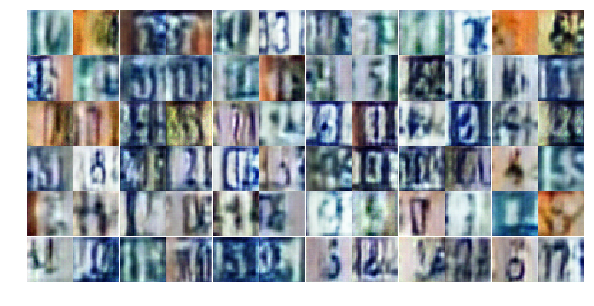

Epoch 6/25... Discriminator Loss: 0.9178... Generator Loss: 0.7344
Epoch 6/25... Discriminator Loss: 0.9601... Generator Loss: 2.7269
Epoch 6/25... Discriminator Loss: 0.8094... Generator Loss: 0.8159
Epoch 6/25... Discriminator Loss: 0.8136... Generator Loss: 1.2060
Epoch 6/25... Discriminator Loss: 1.4308... Generator Loss: 0.3735
Epoch 6/25... Discriminator Loss: 0.6734... Generator Loss: 1.0773
Epoch 6/25... Discriminator Loss: 0.4133... Generator Loss: 1.9174
Epoch 6/25... Discriminator Loss: 1.1009... Generator Loss: 0.5279
Epoch 6/25... Discriminator Loss: 0.7524... Generator Loss: 0.8237
Epoch 6/25... Discriminator Loss: 0.4762... Generator Loss: 2.0137


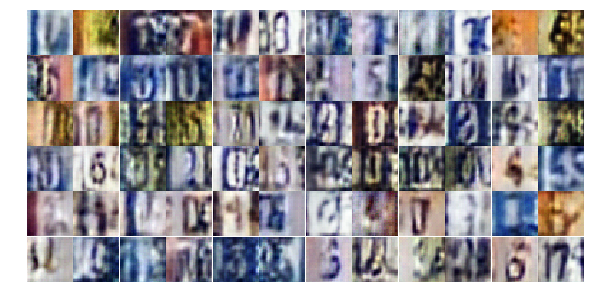

Epoch 6/25... Discriminator Loss: 0.5484... Generator Loss: 1.3217
Epoch 6/25... Discriminator Loss: 3.0248... Generator Loss: 5.2757
Epoch 6/25... Discriminator Loss: 0.9128... Generator Loss: 0.7220
Epoch 6/25... Discriminator Loss: 0.8039... Generator Loss: 0.9237
Epoch 6/25... Discriminator Loss: 0.5092... Generator Loss: 1.5292
Epoch 6/25... Discriminator Loss: 0.4735... Generator Loss: 1.5136
Epoch 6/25... Discriminator Loss: 0.6478... Generator Loss: 1.0663
Epoch 6/25... Discriminator Loss: 0.6140... Generator Loss: 1.1102
Epoch 6/25... Discriminator Loss: 0.6809... Generator Loss: 1.7117
Epoch 6/25... Discriminator Loss: 0.6949... Generator Loss: 1.0564


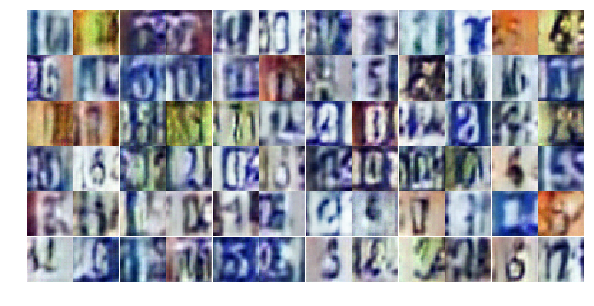

Epoch 6/25... Discriminator Loss: 1.0482... Generator Loss: 0.6385
Epoch 6/25... Discriminator Loss: 0.8507... Generator Loss: 0.7252
Epoch 6/25... Discriminator Loss: 1.1590... Generator Loss: 0.5129
Epoch 6/25... Discriminator Loss: 0.7075... Generator Loss: 0.9864
Epoch 6/25... Discriminator Loss: 0.6015... Generator Loss: 1.5097
Epoch 6/25... Discriminator Loss: 0.9170... Generator Loss: 0.7248
Epoch 6/25... Discriminator Loss: 0.6433... Generator Loss: 1.4609
Epoch 6/25... Discriminator Loss: 0.3744... Generator Loss: 1.5487
Epoch 6/25... Discriminator Loss: 0.4958... Generator Loss: 1.2903
Epoch 6/25... Discriminator Loss: 0.3339... Generator Loss: 2.0726


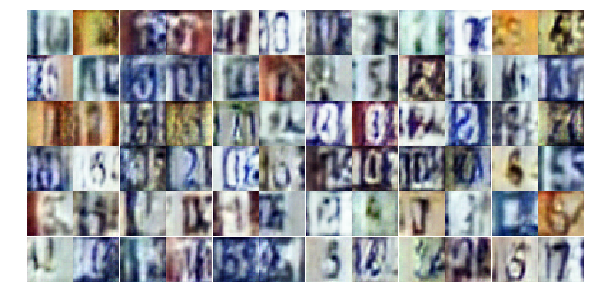

Epoch 6/25... Discriminator Loss: 1.3884... Generator Loss: 2.6598
Epoch 6/25... Discriminator Loss: 1.0576... Generator Loss: 2.8031
Epoch 6/25... Discriminator Loss: 0.6043... Generator Loss: 1.1479
Epoch 6/25... Discriminator Loss: 0.6753... Generator Loss: 1.0312
Epoch 6/25... Discriminator Loss: 0.5289... Generator Loss: 1.3531
Epoch 6/25... Discriminator Loss: 0.7449... Generator Loss: 1.1787
Epoch 6/25... Discriminator Loss: 0.3527... Generator Loss: 1.9297
Epoch 6/25... Discriminator Loss: 0.5317... Generator Loss: 1.2797
Epoch 6/25... Discriminator Loss: 0.5077... Generator Loss: 1.3645
Epoch 6/25... Discriminator Loss: 1.1565... Generator Loss: 0.4704


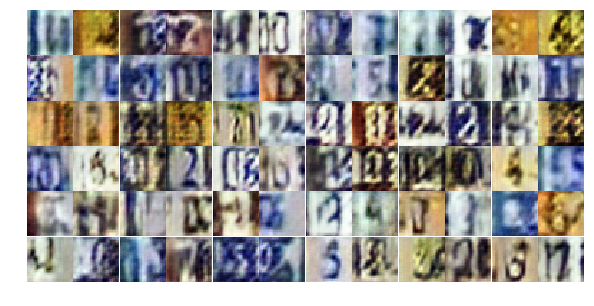

Epoch 6/25... Discriminator Loss: 1.0849... Generator Loss: 2.1441
Epoch 6/25... Discriminator Loss: 1.4419... Generator Loss: 0.3877
Epoch 6/25... Discriminator Loss: 1.1118... Generator Loss: 0.5529
Epoch 6/25... Discriminator Loss: 1.0947... Generator Loss: 0.6981
Epoch 6/25... Discriminator Loss: 0.8058... Generator Loss: 0.8266
Epoch 6/25... Discriminator Loss: 0.5517... Generator Loss: 1.2406
Epoch 6/25... Discriminator Loss: 0.7623... Generator Loss: 0.8837
Epoch 6/25... Discriminator Loss: 1.5014... Generator Loss: 0.3567
Epoch 6/25... Discriminator Loss: 0.6893... Generator Loss: 1.3843
Epoch 6/25... Discriminator Loss: 1.6087... Generator Loss: 0.3066


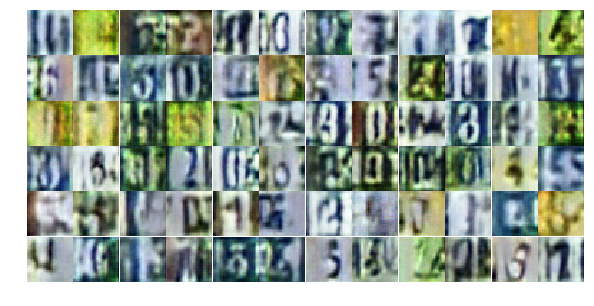

Epoch 6/25... Discriminator Loss: 0.5431... Generator Loss: 1.3282
Epoch 6/25... Discriminator Loss: 0.5414... Generator Loss: 1.2590
Epoch 6/25... Discriminator Loss: 0.4535... Generator Loss: 1.5379
Epoch 7/25... Discriminator Loss: 0.5516... Generator Loss: 1.5053
Epoch 7/25... Discriminator Loss: 0.5071... Generator Loss: 1.2779
Epoch 7/25... Discriminator Loss: 0.8383... Generator Loss: 0.8463
Epoch 7/25... Discriminator Loss: 0.4596... Generator Loss: 1.7390
Epoch 7/25... Discriminator Loss: 0.4744... Generator Loss: 1.4184
Epoch 7/25... Discriminator Loss: 0.4282... Generator Loss: 1.4956
Epoch 7/25... Discriminator Loss: 0.9812... Generator Loss: 0.6449


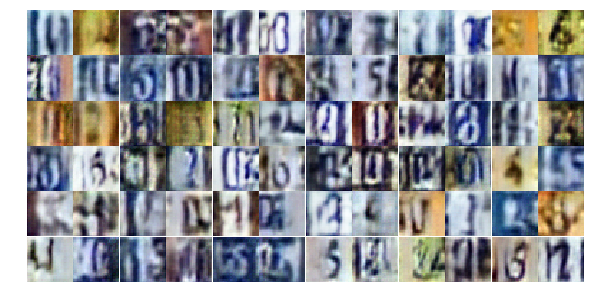

Epoch 7/25... Discriminator Loss: 0.6869... Generator Loss: 2.4860
Epoch 7/25... Discriminator Loss: 1.1975... Generator Loss: 1.7961
Epoch 7/25... Discriminator Loss: 1.3734... Generator Loss: 0.3947
Epoch 7/25... Discriminator Loss: 0.9903... Generator Loss: 2.1189
Epoch 7/25... Discriminator Loss: 0.5490... Generator Loss: 1.8221
Epoch 7/25... Discriminator Loss: 0.6183... Generator Loss: 1.0853
Epoch 7/25... Discriminator Loss: 0.9634... Generator Loss: 2.1565
Epoch 7/25... Discriminator Loss: 0.8158... Generator Loss: 0.9164
Epoch 7/25... Discriminator Loss: 0.6650... Generator Loss: 1.2147
Epoch 7/25... Discriminator Loss: 0.5346... Generator Loss: 1.3765


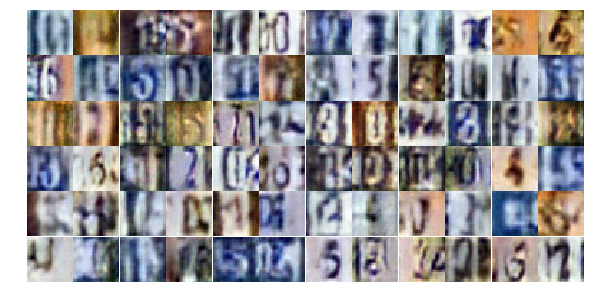

Epoch 7/25... Discriminator Loss: 0.3677... Generator Loss: 1.8011
Epoch 7/25... Discriminator Loss: 0.3406... Generator Loss: 1.8788
Epoch 7/25... Discriminator Loss: 1.2542... Generator Loss: 0.4601
Epoch 7/25... Discriminator Loss: 0.9183... Generator Loss: 1.1930
Epoch 7/25... Discriminator Loss: 0.5111... Generator Loss: 1.4698
Epoch 7/25... Discriminator Loss: 0.5168... Generator Loss: 1.7951
Epoch 7/25... Discriminator Loss: 0.6976... Generator Loss: 0.9262
Epoch 7/25... Discriminator Loss: 0.9371... Generator Loss: 0.6890
Epoch 7/25... Discriminator Loss: 0.3612... Generator Loss: 2.0331
Epoch 7/25... Discriminator Loss: 0.4480... Generator Loss: 1.6167


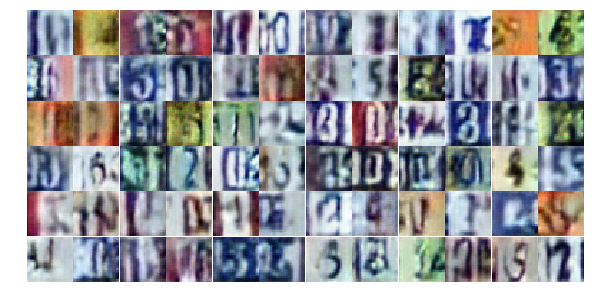

Epoch 7/25... Discriminator Loss: 0.4042... Generator Loss: 1.5762
Epoch 7/25... Discriminator Loss: 0.7391... Generator Loss: 2.0577
Epoch 7/25... Discriminator Loss: 0.7636... Generator Loss: 1.5063
Epoch 7/25... Discriminator Loss: 0.6061... Generator Loss: 1.2734
Epoch 7/25... Discriminator Loss: 0.5738... Generator Loss: 1.0568
Epoch 7/25... Discriminator Loss: 0.8620... Generator Loss: 0.7505
Epoch 7/25... Discriminator Loss: 0.5657... Generator Loss: 1.2193
Epoch 7/25... Discriminator Loss: 0.7063... Generator Loss: 1.0060
Epoch 7/25... Discriminator Loss: 1.0365... Generator Loss: 0.6652
Epoch 7/25... Discriminator Loss: 0.6017... Generator Loss: 3.0064


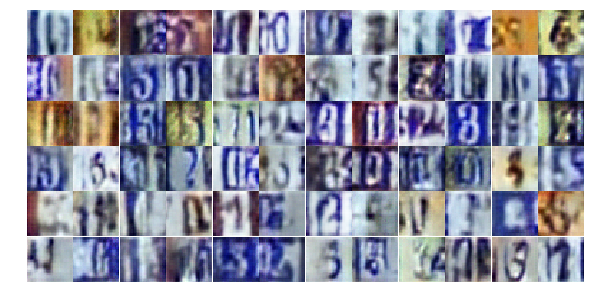

Epoch 7/25... Discriminator Loss: 1.0085... Generator Loss: 0.6934
Epoch 7/25... Discriminator Loss: 0.6969... Generator Loss: 1.3156
Epoch 7/25... Discriminator Loss: 0.5712... Generator Loss: 1.9479
Epoch 7/25... Discriminator Loss: 0.7602... Generator Loss: 0.8751
Epoch 7/25... Discriminator Loss: 0.9208... Generator Loss: 2.7089
Epoch 7/25... Discriminator Loss: 0.3688... Generator Loss: 2.2737
Epoch 7/25... Discriminator Loss: 0.5176... Generator Loss: 1.2999
Epoch 7/25... Discriminator Loss: 1.3846... Generator Loss: 0.4979
Epoch 7/25... Discriminator Loss: 0.3783... Generator Loss: 2.1828
Epoch 7/25... Discriminator Loss: 0.5798... Generator Loss: 1.2904


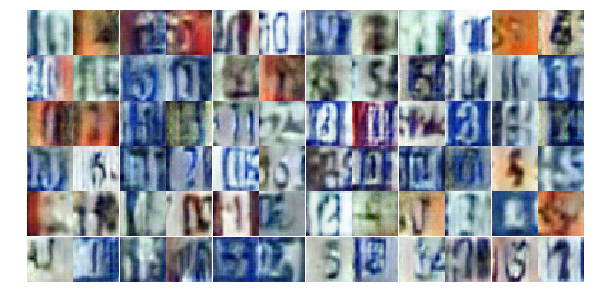

Epoch 7/25... Discriminator Loss: 0.3569... Generator Loss: 1.9496
Epoch 7/25... Discriminator Loss: 0.6570... Generator Loss: 1.2089
Epoch 7/25... Discriminator Loss: 0.7307... Generator Loss: 1.0256
Epoch 7/25... Discriminator Loss: 0.5806... Generator Loss: 1.3872
Epoch 7/25... Discriminator Loss: 0.6632... Generator Loss: 1.3966
Epoch 7/25... Discriminator Loss: 1.5405... Generator Loss: 0.3275
Epoch 7/25... Discriminator Loss: 0.9194... Generator Loss: 0.7221
Epoch 7/25... Discriminator Loss: 0.6866... Generator Loss: 1.1324
Epoch 7/25... Discriminator Loss: 0.7269... Generator Loss: 1.2088
Epoch 7/25... Discriminator Loss: 0.4281... Generator Loss: 1.3864


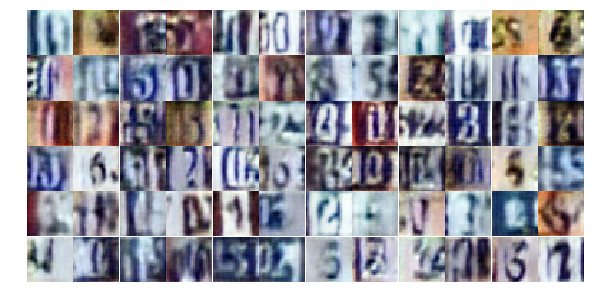

Epoch 7/25... Discriminator Loss: 0.5415... Generator Loss: 2.6591
Epoch 8/25... Discriminator Loss: 0.8640... Generator Loss: 0.7024
Epoch 8/25... Discriminator Loss: 1.2617... Generator Loss: 0.5295
Epoch 8/25... Discriminator Loss: 0.6489... Generator Loss: 1.0660
Epoch 8/25... Discriminator Loss: 0.4917... Generator Loss: 1.5893
Epoch 8/25... Discriminator Loss: 0.9412... Generator Loss: 0.6701
Epoch 8/25... Discriminator Loss: 0.6135... Generator Loss: 1.0716
Epoch 8/25... Discriminator Loss: 0.5212... Generator Loss: 1.2241
Epoch 8/25... Discriminator Loss: 0.9209... Generator Loss: 0.7443
Epoch 8/25... Discriminator Loss: 0.6455... Generator Loss: 1.0771


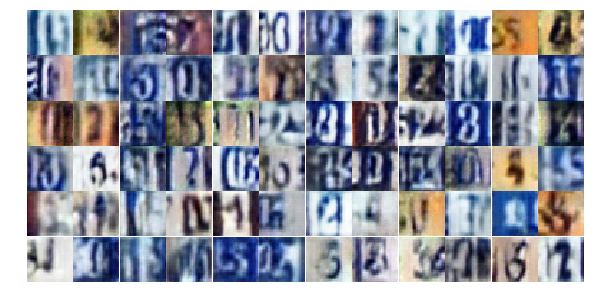

Epoch 8/25... Discriminator Loss: 0.6077... Generator Loss: 1.2747
Epoch 8/25... Discriminator Loss: 0.5017... Generator Loss: 1.4568
Epoch 8/25... Discriminator Loss: 0.6762... Generator Loss: 1.1036
Epoch 8/25... Discriminator Loss: 0.4032... Generator Loss: 1.8668
Epoch 8/25... Discriminator Loss: 1.2944... Generator Loss: 0.5663
Epoch 8/25... Discriminator Loss: 0.5618... Generator Loss: 1.6385
Epoch 8/25... Discriminator Loss: 0.6169... Generator Loss: 1.1198
Epoch 8/25... Discriminator Loss: 0.6085... Generator Loss: 1.3326
Epoch 8/25... Discriminator Loss: 0.5759... Generator Loss: 1.0903
Epoch 8/25... Discriminator Loss: 1.0546... Generator Loss: 0.8617


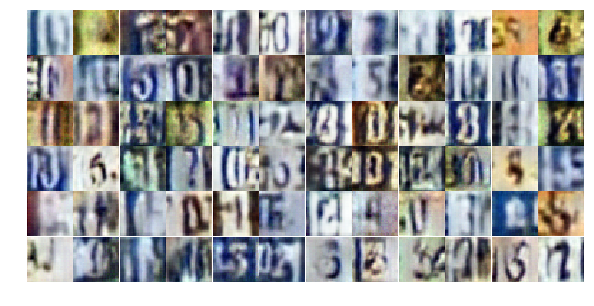

Epoch 8/25... Discriminator Loss: 0.5011... Generator Loss: 1.9296
Epoch 8/25... Discriminator Loss: 0.5453... Generator Loss: 1.2145
Epoch 8/25... Discriminator Loss: 0.6369... Generator Loss: 1.0173
Epoch 8/25... Discriminator Loss: 0.6080... Generator Loss: 2.1140
Epoch 8/25... Discriminator Loss: 0.5465... Generator Loss: 1.1965
Epoch 8/25... Discriminator Loss: 0.6729... Generator Loss: 1.9835
Epoch 8/25... Discriminator Loss: 0.5876... Generator Loss: 1.5891
Epoch 8/25... Discriminator Loss: 0.4311... Generator Loss: 1.7184
Epoch 8/25... Discriminator Loss: 0.7607... Generator Loss: 1.5078
Epoch 8/25... Discriminator Loss: 0.9360... Generator Loss: 0.6842


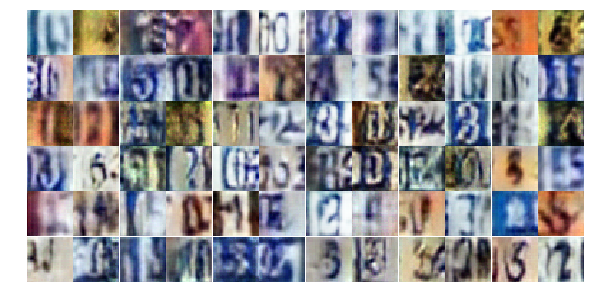

Epoch 8/25... Discriminator Loss: 0.6307... Generator Loss: 1.1343
Epoch 8/25... Discriminator Loss: 0.6857... Generator Loss: 1.0805
Epoch 8/25... Discriminator Loss: 0.8811... Generator Loss: 0.7911
Epoch 8/25... Discriminator Loss: 0.9969... Generator Loss: 0.6388
Epoch 8/25... Discriminator Loss: 1.3542... Generator Loss: 0.4314
Epoch 8/25... Discriminator Loss: 0.3492... Generator Loss: 1.5413
Epoch 8/25... Discriminator Loss: 0.7287... Generator Loss: 0.9249
Epoch 8/25... Discriminator Loss: 0.5344... Generator Loss: 1.3195
Epoch 8/25... Discriminator Loss: 1.2876... Generator Loss: 0.4632
Epoch 8/25... Discriminator Loss: 0.9145... Generator Loss: 0.7366


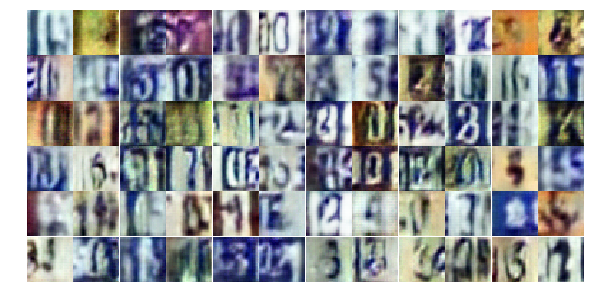

Epoch 8/25... Discriminator Loss: 0.4051... Generator Loss: 1.6650
Epoch 8/25... Discriminator Loss: 1.1455... Generator Loss: 0.6181
Epoch 8/25... Discriminator Loss: 0.7403... Generator Loss: 0.8745
Epoch 8/25... Discriminator Loss: 0.6383... Generator Loss: 1.0664
Epoch 8/25... Discriminator Loss: 1.1154... Generator Loss: 1.1746
Epoch 8/25... Discriminator Loss: 0.9295... Generator Loss: 0.6908
Epoch 8/25... Discriminator Loss: 0.4565... Generator Loss: 1.8917
Epoch 8/25... Discriminator Loss: 0.6911... Generator Loss: 2.1850
Epoch 8/25... Discriminator Loss: 0.5836... Generator Loss: 1.4174
Epoch 8/25... Discriminator Loss: 0.5792... Generator Loss: 1.6026


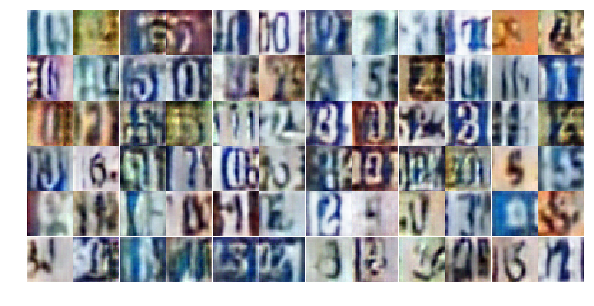

Epoch 8/25... Discriminator Loss: 0.5696... Generator Loss: 1.1741
Epoch 8/25... Discriminator Loss: 0.4357... Generator Loss: 1.5588
Epoch 8/25... Discriminator Loss: 0.4056... Generator Loss: 1.8098


In [ ]:
dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

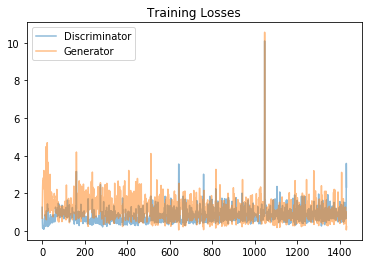

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

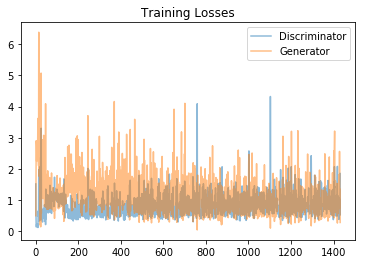

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

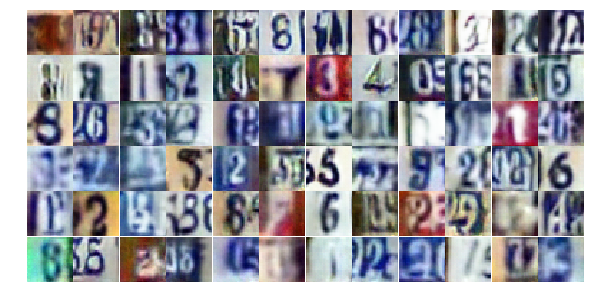

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

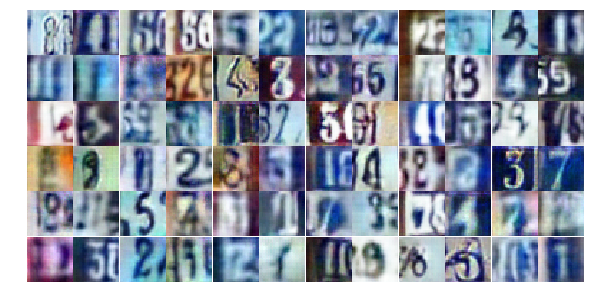

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))